<a href="https://colab.research.google.com/github/ggyupi/PCVK_Ganjil_2025/blob/main/OperasiCitraSederhana.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import cv2 as cv
from google.colab.patches import cv2_imshow
from skimage import io
import matplotlib.pyplot as plt
import numpy as np
import glob, os

 Mengubah tingkat kecerahan citra
----------------------------------
Masukkan nilai kecerahan: 19


/tmp/ipython-input-413313276.py:15: RuntimeWarning: overflow encountered in scalar add
  brightness_image[y,x,a] = np.clip(original[y,x,a] + brightness, 0, 255)


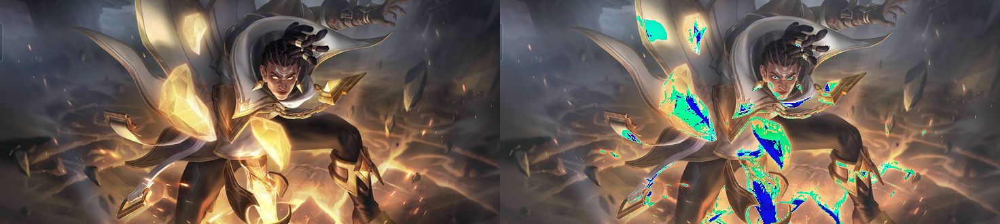

In [4]:
print(' Mengubah tingkat kecerahan citra')
print('----------------------------------')
try:
  brightness = int(input('Masukkan nilai kecerahan: '))
except ValueError:
  print('Error, not a number')

original = cv. imread('/content/drive/MyDrive/PCVK/Images/brody1.jpg')
brightness_image = np.zeros(original.shape, original.dtype)

#akses per piksel
for y in range(original.shape[0]):
  for x in range(original.shape[1]):
    for a in range(original. shape[2]):
      brightness_image[y,x,a] = np.clip(original[y,x,a] + brightness, 0, 255)

#cara simple tanpa for loop
#brightness_image = cv.convertScaleAbs(original, beta=brightness)

final_frame = cv.hconcat((original, brightness_image))
cv2_imshow(final_frame)

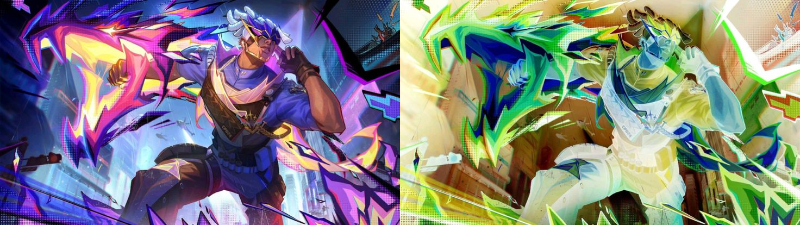

In [7]:
original = cv.imread('/content/drive/MyDrive/PCVK/Images/brody2.jpg')

scale_width = 400
h, w = original.shape[:2]
new_h = int(h * (scale_width / w))
original = cv.resize(original, (scale_width, new_h))

# Inverse / negative
inverse = 255 - original

# Gabungkan dua gambar horizontal
final_frame = cv.hconcat([original, inverse])

# Tampilkan
cv2_imshow(final_frame)


 Mengubah tingkat kontras citra
----------------------------------
Masukkan nilai kecerahan [-255 - 255]: 255
Masukkan nilai kontras, mis. 1-3: 2


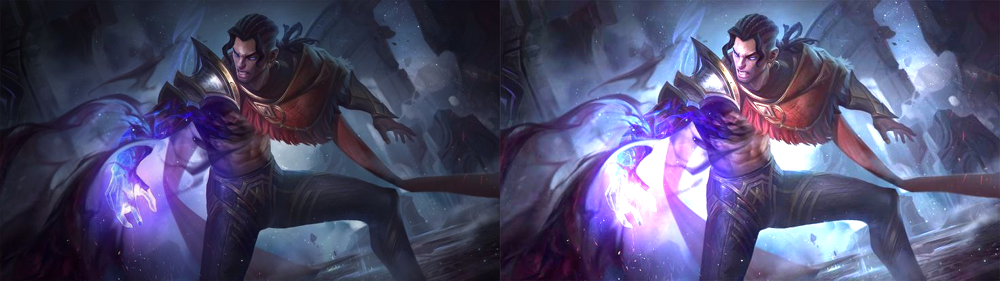

In [9]:
print(' Mengubah tingkat kontras citra')
print('----------------------------------')
try:
    a = int(input('Masukkan nilai kecerahan [-255 - 255]: '))
    b = float(input('Masukkan nilai kontras, mis. 1-3: '))

except ValueError:
    print('Error, input tidak valid')

# Baca gambar
original = cv.imread('/content/drive/MyDrive/PCVK/Images/brody3.jpg')

# Siapkan array kosong
contrast_image = np.zeros(original.shape, original.dtype)

# Akses per piksel
for y in range(original.shape[0]):
    for x in range(original.shape[1]):
        for a in range(original.shape[2]):
            contrast_image[y, x, a] = np.clip(b * original[y, x, a] + a, 0, 255)

final_frame = cv.hconcat((original, contrast_image))
cv2_imshow(final_frame)


 Mengubah brightness dengan Transformasi Logaritmik
----------------------------------------------------
Masukkan nilai konstanta [-255 - 255]: 135


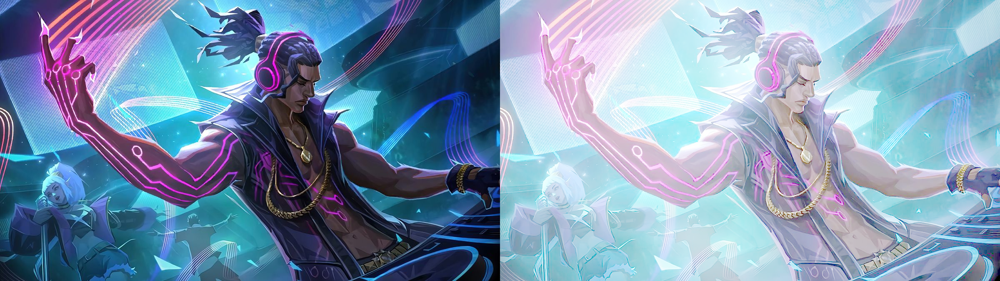

In [10]:
import cv2 as cv
import numpy as np
from google.colab.patches import cv2_imshow

print(' Mengubah brightness dengan Transformasi Logaritmik')
print('----------------------------------------------------')
try:
    c = float(input('Masukkan nilai konstanta [-255 - 255]: '))
except ValueError:
    print('Error, input tidak valid')

original = cv.imread('/content/drive/MyDrive/PCVK/Images/brody4.jpg')

img_float = original.astype(np.float32)

log_image = c * np.log1p(img_float)

log_image = (log_image / log_image.max()) * 255
log_image = log_image.astype(np.uint8)

final_frame = cv.hconcat((original, log_image))
cv2_imshow(final_frame)

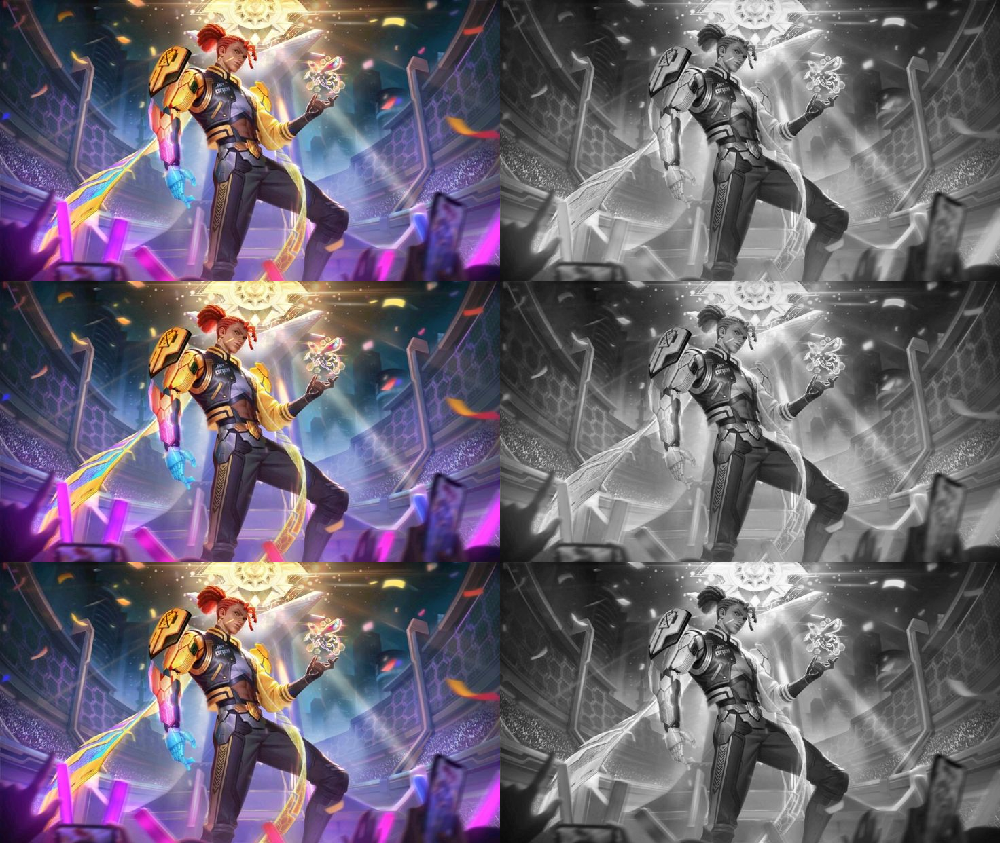

In [11]:
import cv2 as cv
import numpy as np
from google.colab.patches import cv2_imshow

original = cv.imread('/content/drive/MyDrive/PCVK/Images/brody5.jpg')
B, G, R = cv.split(original)

# 1. Averaging
gray_avg = ((R.astype(np.float32) + G.astype(np.float32) + B.astype(np.float32)) / 3).astype(np.uint8)

# 2. Lightness
maxc = np.maximum(np.maximum(R, G), B)
minc = np.minimum(np.minimum(R, G), B)
gray_light = ((maxc.astype(np.float32) + minc.astype(np.float32)) / 2).astype(np.uint8)

# 3. Luminance (perceptual)
gray_lum = (0.21 * R + 0.72 * G + 0.07 * B).astype(np.uint8)

gray_avg_bgr = cv.cvtColor(gray_avg, cv.COLOR_GRAY2BGR)
gray_light_bgr = cv.cvtColor(gray_light, cv.COLOR_GRAY2BGR)
gray_lum_bgr = cv.cvtColor(gray_lum, cv.COLOR_GRAY2BGR)

row1 = cv.hconcat([original, gray_avg_bgr])
row2 = cv.hconcat([original, gray_light_bgr])
row3 = cv.hconcat([original, gray_lum_bgr])

final_frame = cv.vconcat([row1, row2, row3])

# Tampilkan
cv2_imshow(final_frame)


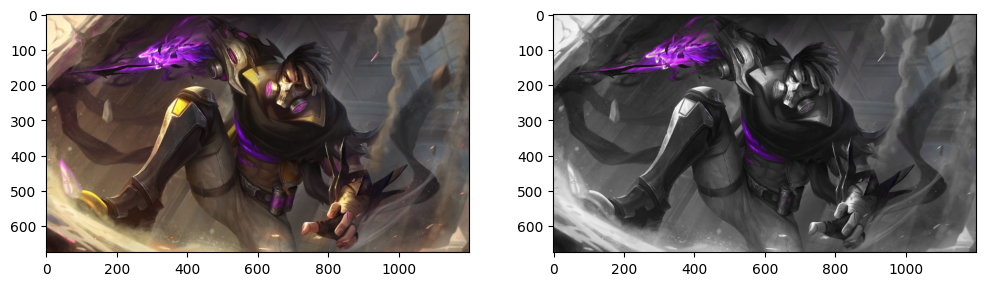

In [12]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

original = cv.imread('/content/drive/MyDrive/PCVK/Images/brody6.jpg')
B, G, R = cv.split(original)

th = 0
mask_blue = (B.astype(np.int16) - R.astype(np.int16) > th) & \
            (B.astype(np.int16) - G.astype(np.int16) > th)

gray_lum = (0.21*R + 0.72*G + 0.07*B).astype(np.uint8)
color_pop = original.copy()
color_pop[~mask_blue] = cv.merge([gray_lum, gray_lum, gray_lum])[~mask_blue]

original_rgb = cv.cvtColor(original, cv.COLOR_BGR2RGB)
color_pop_rgb = cv.cvtColor(color_pop, cv.COLOR_BGR2RGB)

plt.figure(figsize=(12,6))
plt.subplot(1,2,1)
plt.imshow(original_rgb)

plt.subplot(1,2,2)
plt.imshow(color_pop_rgb)
plt.show()
